In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = '3'

In [2]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline
import torch.nn.functional as F
import numpy as np
from models import *
import torch
import torch.optim
from skimage.measure import compare_psnr
from utils.denoising_utils import *
from skimage.io import imsave
from utils.common_mri import MaskFunc
from utils.transform_mri import*

dtype = torch.cuda.FloatTensor

imsize =-1
PLOT=True

In [3]:
import scipy.io as scio
pathh='data/MRI/mask/mask1d0.25.mat'
mask=scio.loadmat(pathh)
mask=mask['k']
mask=torch.tensor(mask).type(dtype)
mask=mask.unsqueeze(0).unsqueeze(0).unsqueeze(-1)
mask=torch.cat((mask,mask),-1)
mask.shape

torch.Size([1, 1, 192, 160, 2])

(160, 192)
(1, 192, 160)


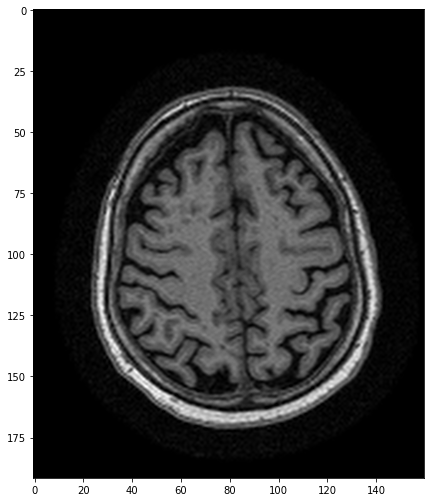

In [4]:
fname = 'data/MRI/img/' 
img_pil = crop_image(get_image(fname+'2.png', imsize)[0], d=32)
print(img_pil.size)
img_np=pil_to_np(img_pil)
img_np = img_np
print(img_np.shape)
img_var=torch.tensor(img_np).type(dtype)
img_var=img_var.unsqueeze(0)
plot_image_grid([img_np], 4, 6);

In [5]:
ssize=img_var.unsqueeze(-1).shape
ZZ=torch.zeros(ssize).type(dtype)
def forwardm(img_var):
    img_var=img_var.unsqueeze(-1)
    img_var_complex=torch.cat((img_var,ZZ),-1)
    img_var_complex=fft2(img_var_complex)
    return img_var_complex
img_var=img_var.unsqueeze(-1)
img_var_complex=torch.cat((img_var,ZZ),-1)
ssize=img_var_complex.size()
measure_noise = torch.cuda.FloatTensor(ssize)
torch.randn(ssize, out=measure_noise)
img_var_complex=img_var_complex+0.1*measure_noise
img_var_complex=fft2(img_var_complex)
measurement=img_var_complex*mask
print(mask.shape)

torch.Size([1, 1, 192, 160, 2])


tensor(10944.)
tensor([[1., 1., 0.,  ..., 1., 1., 1.],
        [1., 1., 0.,  ..., 1., 1., 1.],
        [1., 1., 0.,  ..., 1., 1., 1.],
        ...,
        [1., 1., 0.,  ..., 1., 1., 1.],
        [1., 1., 0.,  ..., 1., 1., 1.],
        [1., 1., 0.,  ..., 1., 1., 1.]])
(1, 192, 160)


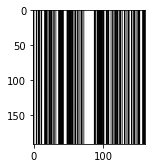

array([[[0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        ...,
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.]],

       [[0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        ...,
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.]],

       [[0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        ...,
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.]]], dtype=float32)

In [6]:
mm=mask[0,0,:,:,0].cpu()
print(mm.sum())
on=torch.ones(mm.shape)
print(on-mm)
aaa=mm.unsqueeze(0).numpy()
print(aaa.shape)
plot_image_grid([aaa])

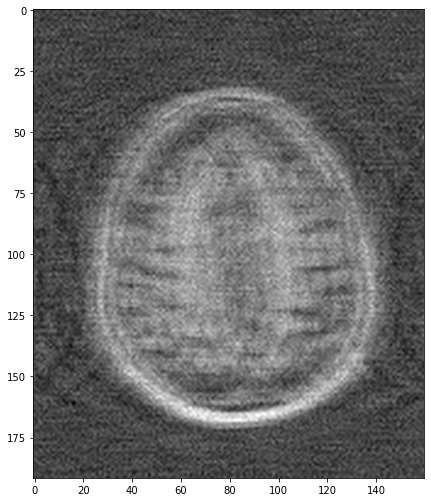

21.15542671281918


/home/wxwang/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
  """


In [7]:
AA=ifft2(measurement)
A=AA[0,:,:,:,0].cpu()
A=A.numpy()
plot_image_grid([A], 4, 6);
print(compare_psnr(np.clip(A,0,1),img_np))


In [8]:
INPUT = 'noise' 
pad = 'reflection'
OPT_OVER = 'net'

reg_noise_std = 1/30.
LR = 0.002
show_every = 100

num_iter = 10000
input_depth = 32
figsize = 2


net=get_net(input_depth,'skip', pad,
                  skip_n33d=128, 
                  skip_n33u=128, 
                  skip_n11=4, 
                  num_scales=5,
                  n_channels=1,
                  upsample_mode='bilinear').type(dtype)  
net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()
# Compute number of parameter
s  = sum([np.prod(list(p.size())) for p in net.parameters()]); 
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

Number of params: 2217573


In [9]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
i = 0
psnr_total=[]
psnr_avg_total=[]
burn_in=1000
loss_data=1
def closure():
    
    global i, out_avg, net_input,loss_data
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    out = net(net_input)
    # calculating average
    if i>burn_in:
        if out_avg is None:
            out_avg=out.detach()
        else:
            out_avg = out_avg * (i-burn_in-1)/(i-burn_in) + out.detach() * 1/(i-burn_in)
    total_loss = mse(mask*forwardm(out),measurement)
    loss_data=total_loss.item()
    total_loss.backward()
    psrn_gt = compare_psnr(img_np, out.detach().cpu().numpy()[0]) 
    psrn_gt_avg=psrn_gt
    if i>burn_in:
        psrn_gt_avg = compare_psnr(img_np, out_avg.detach().cpu().numpy()[0])     
    print ('Iteration %05d   loss_data %f  total_Loss %f  PSRN_gt: %f PSNR_gt_sm: %f' % (i, loss_data, total_loss.item(), psrn_gt, psrn_gt_avg), '\r', end='')
    if  PLOT and i % show_every == 0 and i>burn_in:
        plot_image_grid([np.clip(torch_to_np(out), 0, 1), 
                         np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=1)
    

    
    psnr_total.append(psrn_gt)
    psnr_avg_total.append(psrn_gt_avg)
            
    i += 1

    return total_loss



In [10]:
def add_noise(model,nlevel):
    for n in [x for x in model.parameters() if len(x.size()) == 4]:
        noise = torch.randn(n.size())*4*LR*nlevel
        noise = noise.type(dtype)
        n.data = n.data + noise

/home/wxwang/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:26: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.


/home/wxwang/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:29: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.


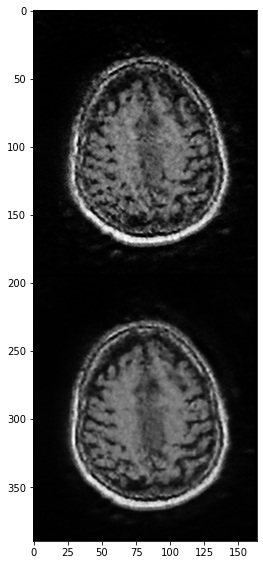

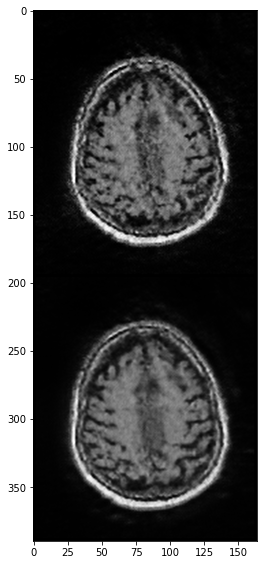

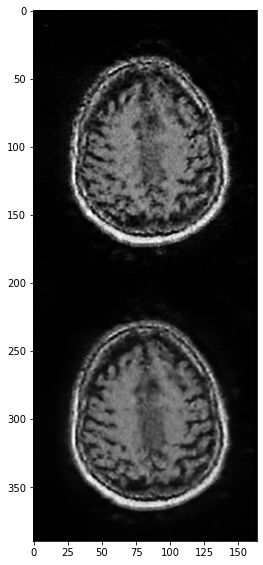

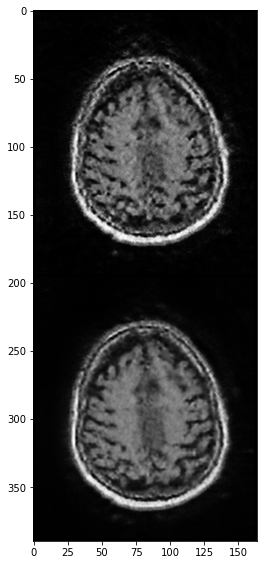

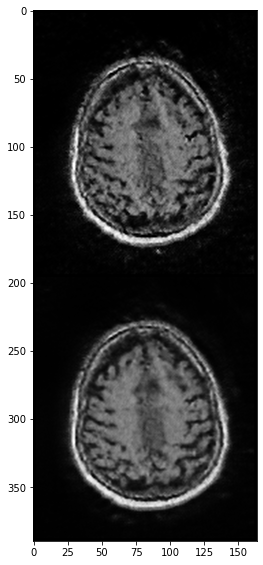

...

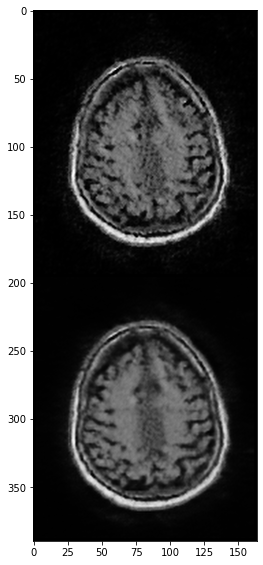

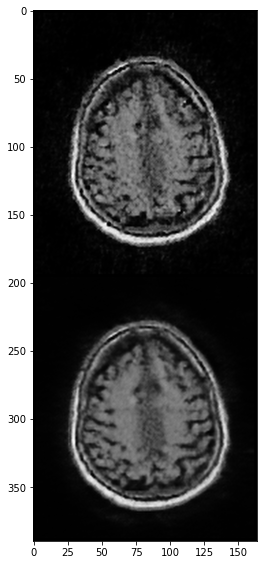

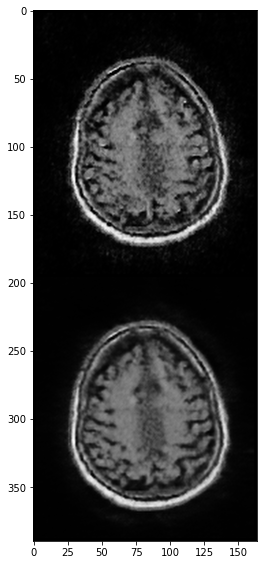

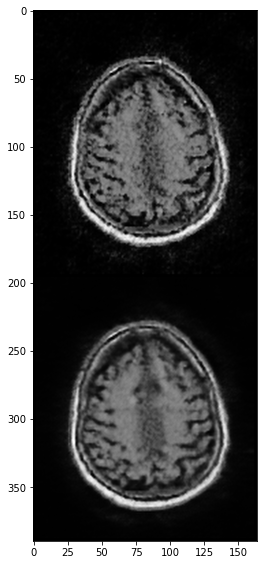

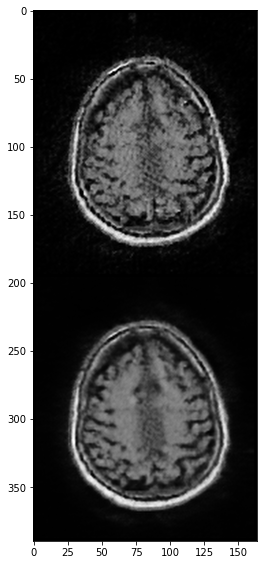

In [ ]:
measure_error=1*(10944/(160*192))*(0.1)**2 
import math
optimizer = torch.optim.Adam([{'params':net.parameters()}], lr=LR,weight_decay=1e-5)
for _ in range(num_iter):
    nlevel=math.exp(40*((measure_error/loss_data)-1))
    optimizer.zero_grad()
    closure()
    optimizer.step()
    add_noise(net,nlevel)

In [41]:
import matplotlib.pyplot as plt

x=range(20000)
plt.xlabel("Iteration")
plt.ylabel("PSNR(dB)")
plt.plot(x, A_3,label='AdamLD with avg',color="r", linestyle="--", linewidth=1.0 ) 
#plt.plot(x, ,label='Adam',  linewidth=0.5 )
plt.legend()
plt.show() 

TypeError: can't multiply sequence by non-int of type 'float'

In [82]:
a=np.zeros(20000)
b=np.ones(20000)
b=b*0.01
for i in range(20000):
    a[i]=(160*192)*loss_total[i]/10944
    

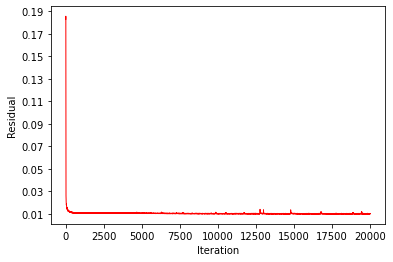

In [99]:
import matplotlib.pyplot as plt
x=range(20000)
plt.xlabel("Iteration")
plt.ylabel("Residual")
plt.plot(x, a,color="r", linewidth=1.0 ) 
#plt.plot(x, ,label='Adam',  linewidth=0.5 )
plt.yticks([0.01,0.03,0.05,0.07,0.09,0.11,0.13,0.15,0.17,0.19])
#plt.legend()
plt.show() 

In [13]:
import cv2
path='result/Compressed_sensing/Show/'
path=path+'302_SGLDnoise2.png'
out_img=torch.clamp(out_avg.squeeze().cpu(),0.,1.)
out_img=out_img.detach().numpy()
print(out_img.shape)
cv2.imwrite(path,255*out_img)

(192, 160)


True

In [13]:
np.savetxt('plot/mri_DIPa.txt',psnr_total)
np.savetxt('plot/mri_DIP.txt',psnr_total2)

In [19]:
A_2=np.loadtxt("adamLD.txt", delimiter=',')
A_1=np.loadtxt("adamLDa2.txt", delimiter=',')

In [20]:
AdamLD=np.zeros(20000)
AdamLDa=np.zeros(20000)
for i in range (20000):
    AdamLD[i]=A_2[i]
    AdamLDa[i]=A_1[i]

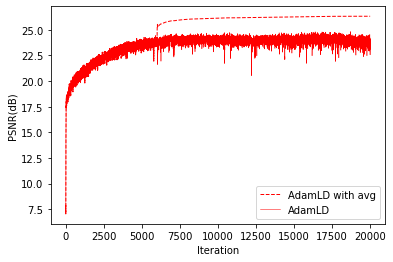

In [14]:
import matplotlib.pyplot as plt
A_3=psnr_total
A_4=psnr_total2
x=range(20000)
plt.xlabel("Iteration")
plt.ylabel("PSNR(dB)")
plt.plot(x, A_3,label='AdamLD with avg',color="r", linestyle="--", linewidth=1.0 ) 
plt.plot(x, A_4,label='AdamLD',color="r",  linewidth=0.5 )
#plt.plot(x, ,label='Adam',  linewidth=0.5 )
plt.legend()
plt.show() 

In [ ]:
import matplotlib.pyplot as plt
x=range(30000)
plt.xlabel("Iteration")
plt.ylabel("PSNR(dB)")
plt.plot(x, A_2,label='Adam+N',color="r",  linewidth=0.5 )
plt.plot(x, A_1,label='Adam+N with avg',color="r", linestyle="--", linewidth=1.0  ) 
plt.plot(x, A_6,label='Adam',linewidth=0.5  )
plt.legend()
plt.show() 

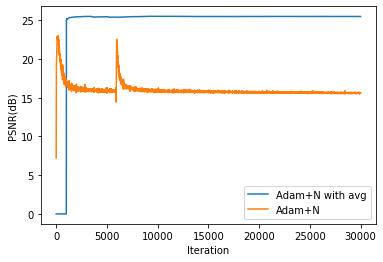

In [33]:
import matplotlib.pyplot as plt
x=range(30000)
A_5=psnr_total
A_6=psnr_total2
plt.xlabel("Iteration")
plt.ylabel("PSNR(dB)")
plt.plot(x, A_5,label='Adam+N with avg' ) 
plt.plot(x, b,label='Adam+N' )
plt.legend()
plt.show() 

In [1]:
import numpy as np
x2 = np.loadtxt("adam.txt", delimiter=',')
x3=np.loadtxt("adamLD.txt", delimiter=',')
x4=np.loadtxt("adamLDa.txt", delimiter=',')
x5=np.loadtxt("adamN.txt", delimiter=',')
x6=np.loadtxt("adamNa.txt", delimiter=',')
for i in range(1001):
    x4[i]=x3[i]
for i in range(6001):
    x6[i]=x5[i]
def shrink(x,n):
    length=len(x)
    y=[]
    for i in range(length):
        if i%n==0:
            y.append(x[i])
    return y
np.savetxt('adamLDa2.txt',x4)
np.savetxt('adamNa2.txt',x6)
#x1=shrink(x1,100)         
x2=shrink(x2,100)  
x3=shrink(x3,100) 
x4=shrink(x4,100) 
x5=shrink(x5,100) 
x6=shrink(x6,100) 

In [17]:
import cv2
path='result/Compressed_sensing/Show/'
path=path+'SGLD.png'
out_img=torch.clamp(out_avg.squeeze().cpu(),0.,1.)
out_img=out_img.detach().numpy()
print(out_img.shape)
cv2.imwrite(path,255*out_img)

(192, 160)


True

In [26]:
import numpy as np

x1 =  np.loadtxt("SGLD.txt", delimiter=',')
x2 = np.loadtxt("plot/mri_DIP.txt", delimiter=',')
x3=np.loadtxt("adamLD.txt", delimiter=',')
x4=np.loadtxt("adamLDa2.txt", delimiter=',')
x5=np.loadtxt("adamN.txt", delimiter=',')
x6=np.loadtxt("adamNa2.txt", delimiter=',')
x7=np.loadtxt("BNN2.txt", delimiter=',')
x8=np.loadtxt("BNNa2.txt", delimiter=',')
print(len(x1))
def shrink(x,n):
    length=len(x)
    y=[]
    for i in range(length):
        if i%n==0:
            y.append(x[i])
    return y

x1=shrink(x1,100)         
x2=shrink(x2,100)  
x3=shrink(x3,100) 
x4=shrink(x4,100) 
x5=shrink(x5,100) 
x6=shrink(x6,100) 
x7=shrink(x7,10) 
x4=0.2*np.ones(300)+x4

30000


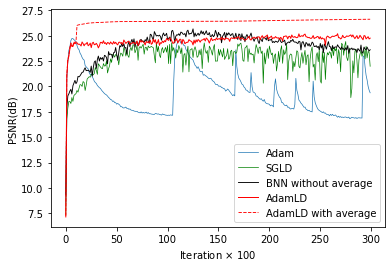

In [22]:
import matplotlib.pyplot as plt
x=range(300)
plt.xlabel(r"Iteration $\times$ 100")
plt.ylabel("PSNR(dB)")
#plt.plot(x, x1,label='SGLD', linewidth=0.7,color='k'  ) 
plt.plot(x, x2,label='Adam' , linewidth=0.7 )
plt.plot(x, x5,label='SGLD' , linewidth=0.7,color="g")
#plt.plot(x, x6,label='Adam+N with average' , linewidth=1,color="g" , linestyle="--")
plt.plot(x, x7,label='BNN without average' , linewidth=0.9,color='k' )
plt.plot(x, x3,label='AdamLD', linewidth=1,color="r" )
plt.plot(x, x4,label='AdamLD with average' , linewidth=0.9,color="r" , linestyle="--")
#plt.plot(x, x8,label='BNN' , linewidth=1,color='k',linestyle="--")
plt.legend()
plt.show() 

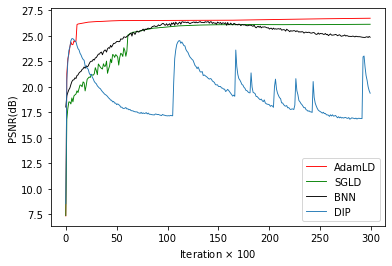

In [27]:
plt.xlabel(r"Iteration $\times$ 100")
plt.ylabel("PSNR(dB)")
plt.plot(x, x4,label='AdamLD' ,color="r",linewidth=0.9)
plt.plot(x, x6,label='SGLD'  ,color="g",linewidth=0.9)
plt.plot(x, x8,label='BNN' , color='k',linewidth=0.9)
plt.plot(x, x2,label='DIP' , linewidth=0.9 )
plt.legend()
plt.show() 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
data = pd.read_csv('test_img3.csv',header=None)
Data = data.values
x=range(300)
plt.xlabel(r"Iteration $\times$ 100")
plt.ylabel("PSNR(dB)")
plt.plot(x, Data[:,0],label='AdamLD' ,color="r",linewidth=0.9)
plt.plot(x, Data[:,1],label='SGLD'  ,color="g",linewidth=0.9)
plt.plot(x, Data[:,2],label='BNN' , color='k',linewidth=0.9)
plt.plot(x, Data[:,3],label='DIP' , linewidth=0.9 )
plt.legend()
plt.savefig('test_img3.png')
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'test_img3.csv'

In [7]:
import torch
a=torch.ones(10)
b=torch.poisson(10*a)
b-10*a

tensor([-2.,  5.,  1.,  0., -7., -2.,  2., -4., -6., -1.])

In [6]:
torch.norm(a)

tensor(5.4772)

In [71]:
k=0
for i in range(100):
    if a[i]>1:
        k=k+1

In [72]:
k

12